<a href="https://colab.research.google.com/github/flatironinstitute/2026-flatiron-cmb-summer-school/blob/main/notebooks/CMB_beam_and_noise_modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instrument Beam, Instrument Noise, and Filtering
### Jeff McMahon and Renée Hložek

We will now add noise and filter the map - so that we have a map with all astrophysical and instrumental effects.

In [1]:
!python -c "import cmb_modules" || ( \
    wget https://raw.githubusercontent.com/flatironinstitute/2026-flatiron-cmb-summer-school/refs/heads/main/notebooks/cmb_modules.py \
    wget https://raw.githubusercontent.com/flatironinstitute/2026-flatiron-cmb-summer-school/refs/heads/main/notebooks/constants.py \
    wget https://raw.githubusercontent.com/flatironinstitute/2026-flatiron-cmb-summer-school/refs/heads/main/notebooks/CAMB_fiducial_cosmo_scalCls.dat \
)

!python -c "import camb" || python -m pip install camb

In [2]:
import numpy as np
import matplotlib
import sys
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import astropy.io.fits as fits

import constants as cs # the constants module
import cmb_modules # the module of functions

N = int(cs.N)
c_min = cs.c_min
c_max = cs.c_max
X_width =cs.X_width
Y_width = cs.Y_width
beam_size_fwhp = cs.beam_size_fwhp

pix_size = cs.pix_size

Number_of_Sources  = cs.Number_of_Sources
Amplitude_of_Sources = cs.Amplitude_of_Sources
Number_of_Sources_EX = cs.Number_of_Sources_EX
Amplitude_of_Sources_EX = cs.Amplitude_of_Sources_EX

Number_of_SZ_Clusters  = cs.Number_of_SZ_Clusters
Mean_Amplitude_of_SZ_Clusters = cs.Mean_Amplitude_of_SZ_Clusters
SZ_beta = cs.SZ_beta
SZ_Theta_core = cs.SZ_Theta_core

## Recalculating the results from the previous stages

c:\Users\ricco\OneDrive\Desktop\Grad_Schools\Schools\UC_Riverside\research\2026-flatiron-cmb-summer-school\notebooks\cmb_modules.py:15: RuntimeWarning: invalid value encountered in divide
  ClTT = DlTT * 2 * np.pi / (ell * (ell + 1.0))


Number of sources required:  5000


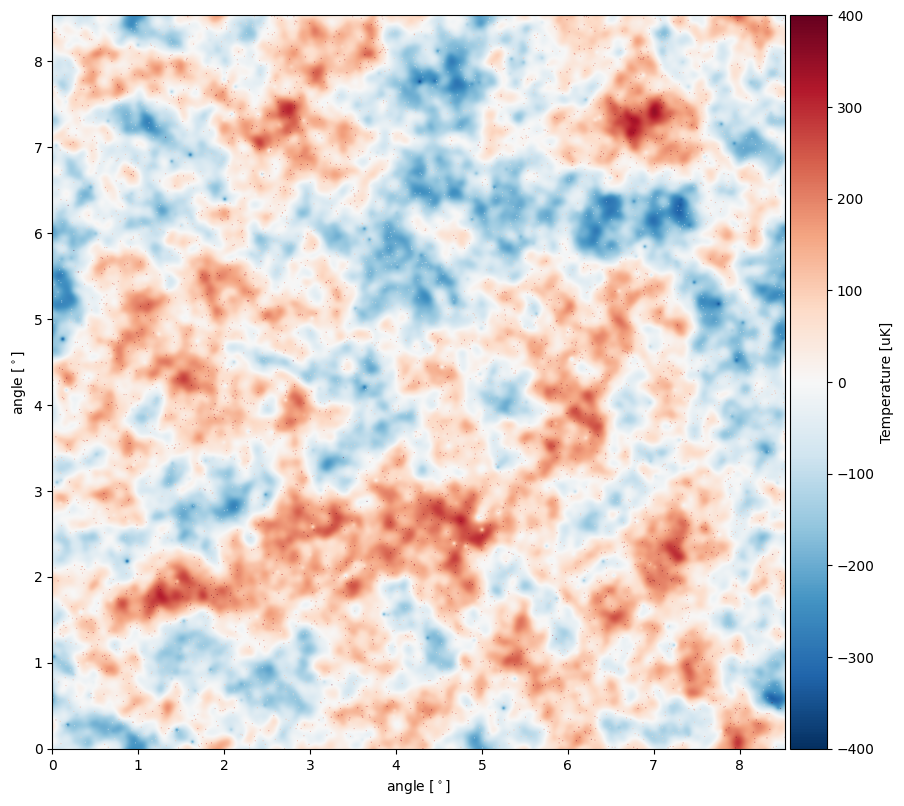

In [3]:
## Make a CMB map
ell, DlTT = np.loadtxt("CAMB_fiducial_cosmo_scalCls.dat", usecols=(0, 1), unpack=True)
CMB_T = cmb_modules.make_CMB_T_map(N,pix_size,ell,DlTT)

## make a point source map
PSMap = cmb_modules.Poisson_source_component(N,pix_size,Number_of_Sources,Amplitude_of_Sources)
PSMap +=  cmb_modules.Exponential_source_component(N,pix_size,Number_of_Sources_EX,Amplitude_of_Sources_EX)

## make an SZ map
SZMap,SZCat = cmb_modules.SZ_source_component(N,pix_size,Number_of_SZ_Clusters,\
                                  Mean_Amplitude_of_SZ_Clusters,SZ_beta,SZ_Theta_core,False)

## add them all together to get the sky map at a single freuqency
total_map = CMB_T + PSMap + SZMap

## plot the result
p=cmb_modules.Plot_CMB_Map(total_map,c_min,c_max,X_width,Y_width)



## Sky Map Convolved with a Beam

Telescopes suffer from diffraction which leads to finite resolution effects (have you ever heard the term 'diffraction-limited optics'?). The resolution of the telescope is adjusted so that it matches the angular scale of the effects we want to observe.  The true beams are not perfectly Gaussian but look more like Airy patterns due to diffraction by the telesope aperture. They also carry various non-idealities that can cause temperature to polarization leakage, mixing of the two polarized components and generally introduce statistical anisotropy in the CMB spectra, in case for example of asymmetric beams. This notebook approximates the beam as Gaussian which is sufficient to first order and convolves the map with it by using the simplest approach of multiplication in Fourier space. Standard deconvolution also happens in this way (dividing out the beam in ell-space from the sky spectra before feeding them to the cosmological analysis pipelines).

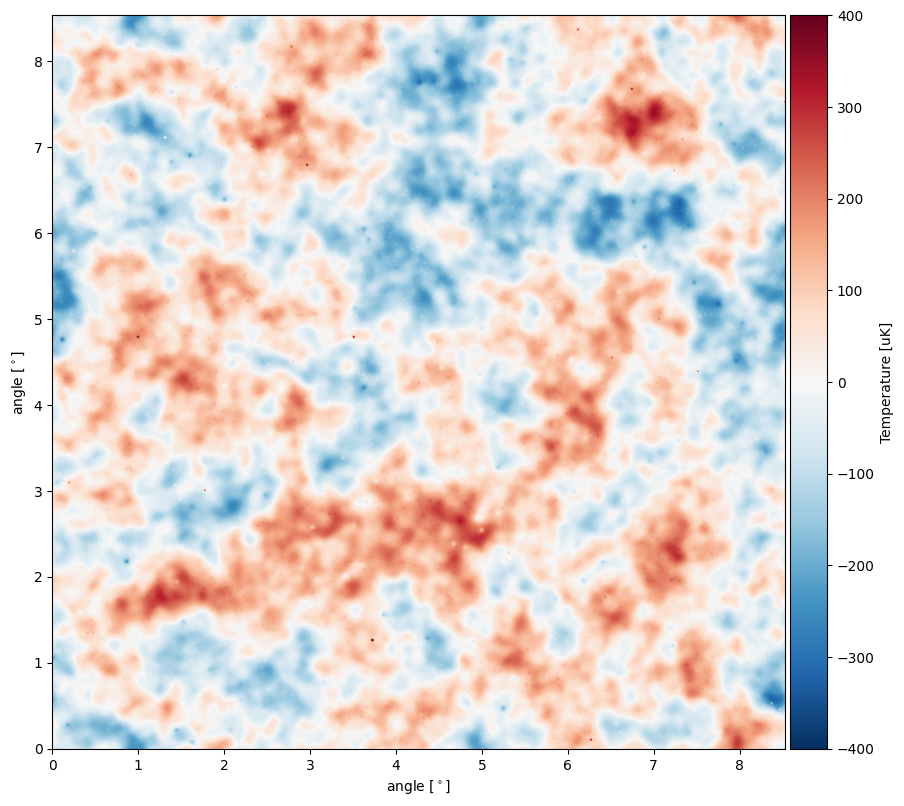

In [4]:
beam_size_fwhp = 1.25 # arcminutes

def convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,Map):
    "convolves a map with a Gaussian beam pattern.  NOTE: pix_size and beam_size_fwhp need to be in the same units"
    # make a 2d gaussian
    gaussian = make_2d_gaussian_beam(N,pix_size,beam_size_fwhp)

    # do the convolution
    FT_gaussian = np.fft.fft2(np.fft.fftshift(gaussian)) # first add the shift so that it is central
    FT_Map = np.fft.fft2(np.fft.fftshift(Map)) #shift the map too
    convolved_map = np.fft.fftshift(np.real(np.fft.ifft2(FT_gaussian*FT_Map)))

    # return the convolved map
    return(convolved_map)
  ###############################

def make_2d_gaussian_beam(N,pix_size,beam_size_fwhp):
     # make a 2d coordinate system
    N=int(N)
    ones = np.ones(N)
    inds  = (np.arange(N)+.5 - N/2.) * pix_size
    X = np.outer(ones,inds)
    Y = np.transpose(X)
    R = np.sqrt(X**2. + Y**2.)
    # plt.title('Radial coordinates')
    # plt.imshow(R)
    # plt.colorbar()
    # plt.show()

    # make a 2d gaussian
    beam_sigma = beam_size_fwhp / np.sqrt(8.*np.log(2))
    gaussian = np.exp(-.5 *(R/beam_sigma)**2.)
    gaussian = gaussian / np.sum(gaussian)
    # return the gaussian
    # plt.title('Gaussian beam')
    # plt.imshow(gaussian)
    # plt.colorbar()
    # plt.show()
    return(gaussian)
  ###############################


## convolve the signal part of the map

CMB_T_convolved = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,total_map)

p=cmb_modules.Plot_CMB_Map(CMB_T_convolved,c_min,c_max,X_width,Y_width)

This plot shows the simulated map that includes the CMB, point source, and SZ signals and is convolved with an instrumental beam.  The agreement with the real sky maps is now reasonable, but does not yet include instrumental noise.

If you want to see a bit more of the inner-workings of what happened, uncomment the lines in the make_2d_gaussian_beam function that make plots of the R coordinates and beam itself.

<font color='red'>EXERCISE: </font>  There are three typical beam sizes for CMB experiments: 1) large angular scale B-mode observatories which have ~30 arcminute beams; 2) medium scale observatories such as the Planck satellite that has a ~3 arcminute beam, and 3) high resolution observatories such as ACT and SPT that have ~1 arcminute beams.  Convolve your map with each of these cases and compare the differences.

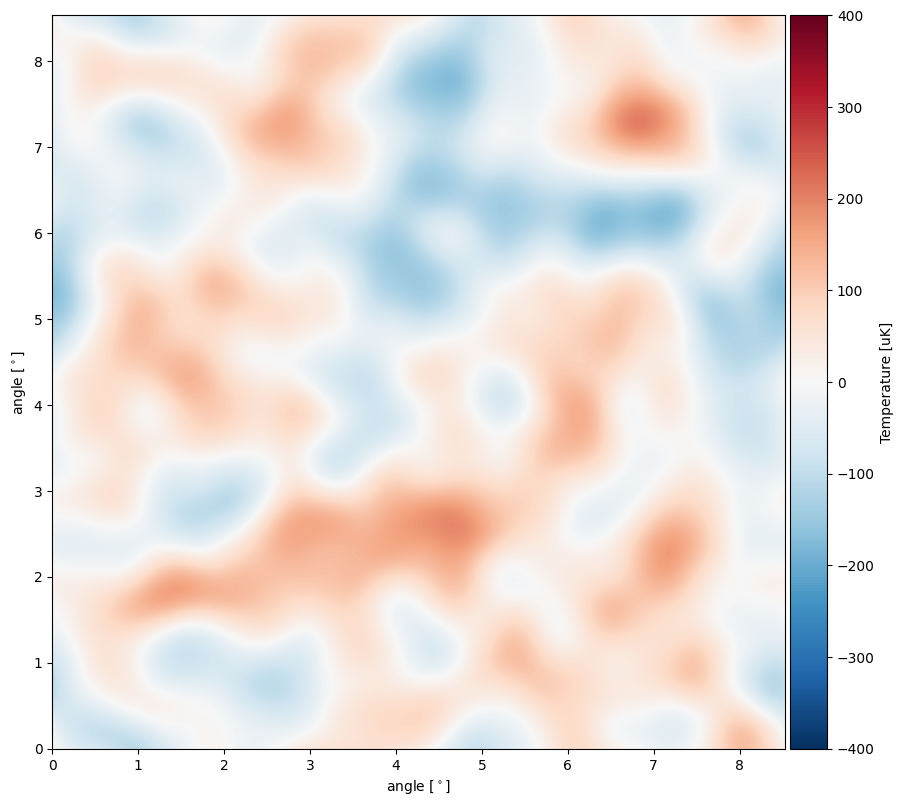

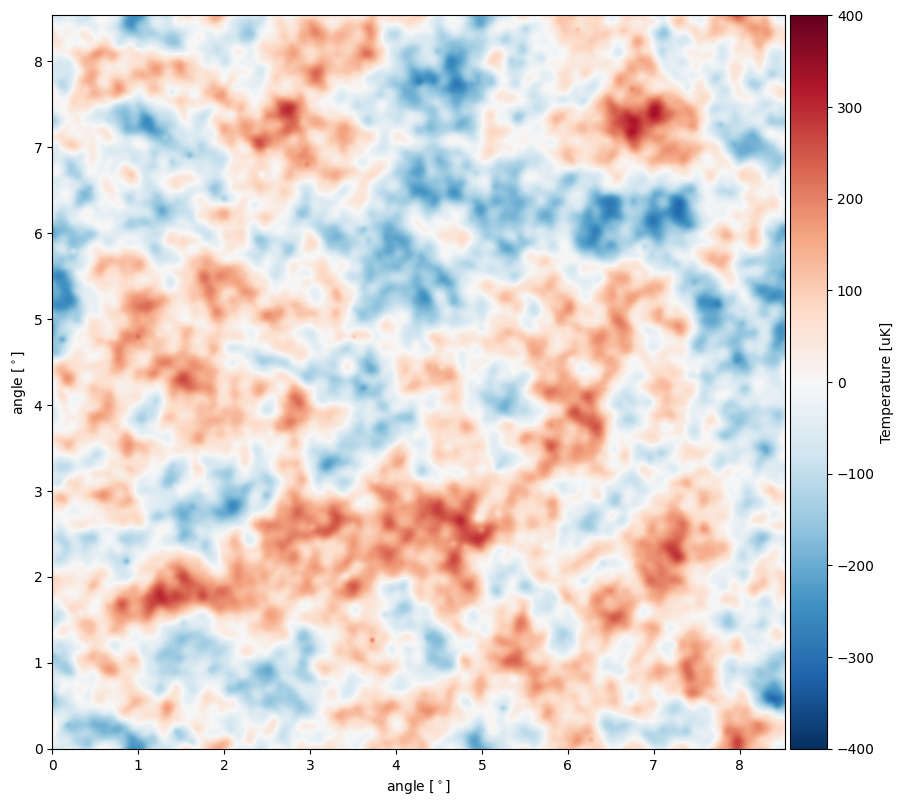

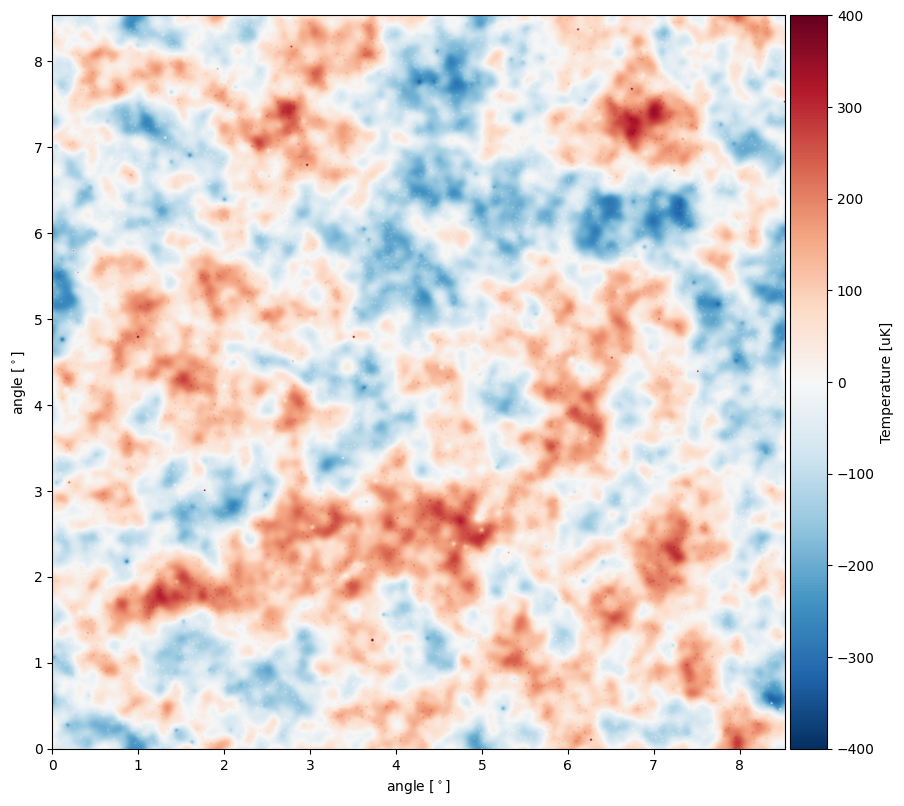

In [8]:
# Your code goes here
b_mode_beam = 30 # arcmin
planck_beam = 3 # arcmin
act_beam = 1 # arcmin

CMB_T_convolved = convolve_map_with_gaussian_beam(N,pix_size,b_mode_beam,total_map)

p=cmb_modules.Plot_CMB_Map(CMB_T_convolved,c_min,c_max,X_width,Y_width)

CMB_T_convolved = convolve_map_with_gaussian_beam(N,pix_size,planck_beam,total_map)

p=cmb_modules.Plot_CMB_Map(CMB_T_convolved,c_min,c_max,X_width,Y_width)

CMB_T_convolved = convolve_map_with_gaussian_beam(N,pix_size,act_beam,total_map)

p=cmb_modules.Plot_CMB_Map(CMB_T_convolved,c_min,c_max,X_width,Y_width)

## Noise Map

Ground based CMB instruments suffer from several types of noise.  This includes: (1) White noise drawn from a gaussian distribution; (2) atmospheric noise which grows larger on large angular scales, this can be understood in terms of Kolmogorov turbulence $ P(k) \propto k^{-8/3} $; and (3) $1/f$ noise in the detectors.  Both atmospheric and detector $1/f$ manifest as correlated noise in map space.  However, like the CMB these noise components are very nearly uncorrelated in Fourier space.  We will build these noise terms in Fourier space and display them in map space.

We choose a white noise level of 10 $\mu\mathrm{K}$-arcmin to approximate the current deep maps coming from ACTPol and SPTPol.  The $1/f$ noise is similar to what would be seen in an experiment at the south pole.  When turned on, this noise leads to the effect of "striping" in the maps.  In later notebooks, we default to turning the atmospheric and 1/f noise components off since if they are included we may want to filter the maps before estimating the power spectrum.  (This is easy, but is not yet implemented).  The atmospheric noise (Kolmogorov turbulence) has a 2D spectrum similar to CMB leading to similar patterns in the maps.

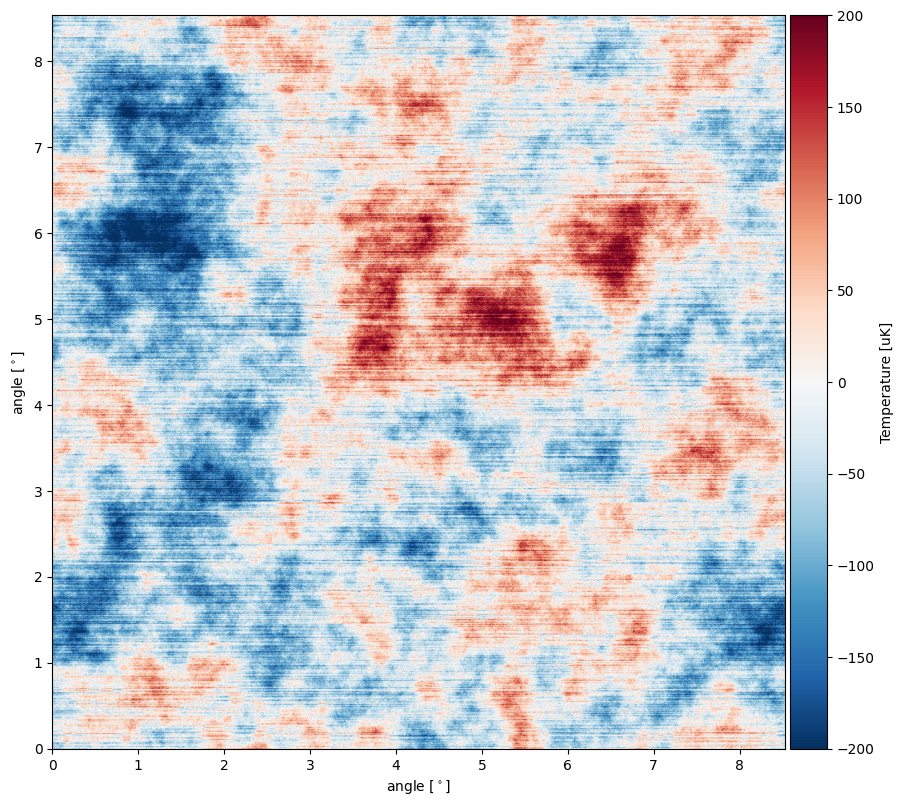

In [9]:
white_noise_level = 10.
atmospheric_noise_level = 0.5  # multiply by zero to turn this off
one_over_f_noise_level = 0.2 # multiply by zero to turn this off

def make_noise_map(N,pix_size,white_noise_level,atmospheric_noise_level,one_over_f_noise_level):
    "makes a realization of instrument noise, atmosphere and 1/f noise level set at 1 degrees"
    ## make a white noise map
    white_noise = np.random.normal(0,1,(N,N)) * white_noise_level/pix_size

    ## make an atnosperhic noise map
    atmospheric_noise = 0.
    if (atmospheric_noise_level != 0):
        ones = np.ones(N)
        inds  = (np.arange(N)+.5 - N/2.)
        X = np.outer(ones,inds)
        Y = np.transpose(X)
        R = np.sqrt(X**2. + Y**2.) * pix_size /60. ## angles relative to 1 degrees
        #Converts radius to a rough wavenumber-like quantity
        mag_k = 2 * np.pi/(R+.01)  ## 0.01 is a regularization factor
        atmospheric_noise = np.fft.fft2(np.random.normal(0,1,(N,N)))
        atmospheric_noise  = np.fft.ifft2(atmospheric_noise * np.fft.fftshift(mag_k**(5/3.)))
        atmospheric_noise = atmospheric_noise * atmospheric_noise_level/pix_size

    ## make a 1/f map, along a single direction to illustrate striping
    oneoverf_noise = 0.
    if (one_over_f_noise_level != 0):
        ones = np.ones(N)
        inds  = (np.arange(N)+.5 - N/2.)
        #Builds a coordinate grid for one direction only
        X = np.outer(ones,inds) * pix_size /60. ## angles relative to 1 degrees
        kx = 2 * np.pi/(X+.01) ## 0.01 is a regularization factor
        oneoverf_noise = np.fft.fft2(np.random.normal(0,1,(N,N)))
        #Shapes it so one direction has stronger low-frequency structure
        oneoverf_noise = np.fft.ifft2(oneoverf_noise * np.fft.fftshift(kx))
        oneoverf_noise = oneoverf_noise * one_over_f_noise_level/pix_size

    ## return the noise map
    noise_map = np.real(white_noise + atmospheric_noise + oneoverf_noise)
    return(noise_map)
  ###############################

## make an instrument noise map
Noise = make_noise_map(N,pix_size,white_noise_level,atmospheric_noise_level,one_over_f_noise_level)

p=cmb_modules.Plot_CMB_Map(Noise,c_min/2.,c_max/2.,X_width,Y_width)

This plot shows a realization of instrumental + atmospheric noise.  The atmospheric noise looks similar to the CMB since it has a similar 2d spectrum.  

<font color='red'>EXERCISE: </font>  The above simulation has both atmospheric and detector $1/f$ noise.   To understand these components seperately, turn each off and make plots of each component seperately.  Comment on how these look.  

Part 2: Plot the absolute value of the 2-d FFT of these maps and note how the non-white component of the noise is localized.   

NOTE: This map assumes no cross-linking, the $1/f$ would look different if there were two or more scan directions in the map.

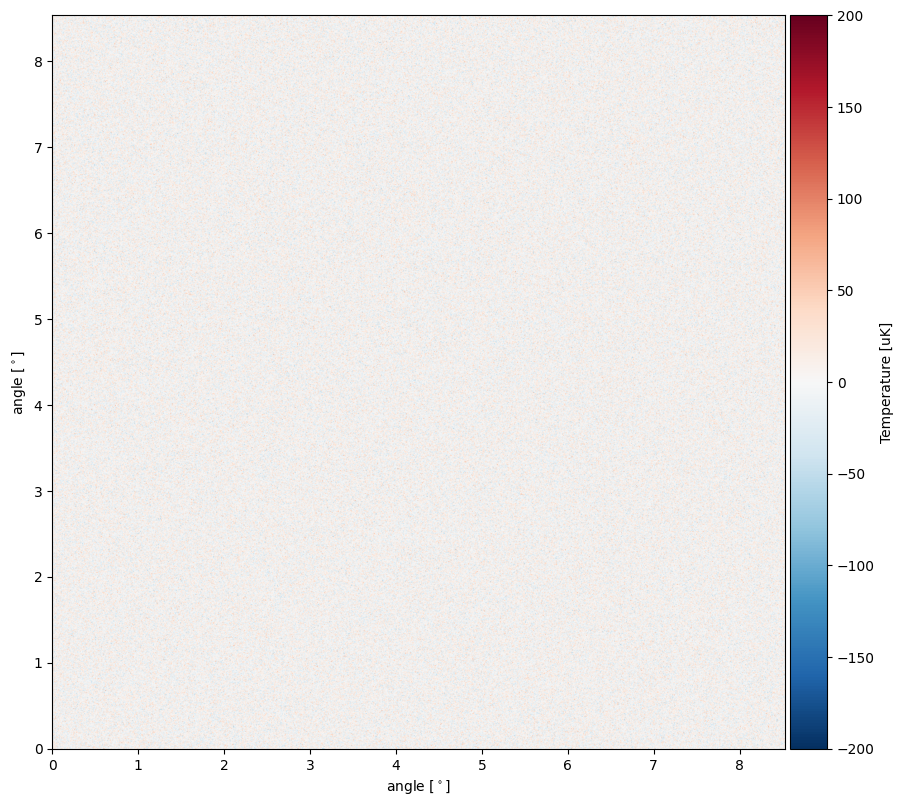

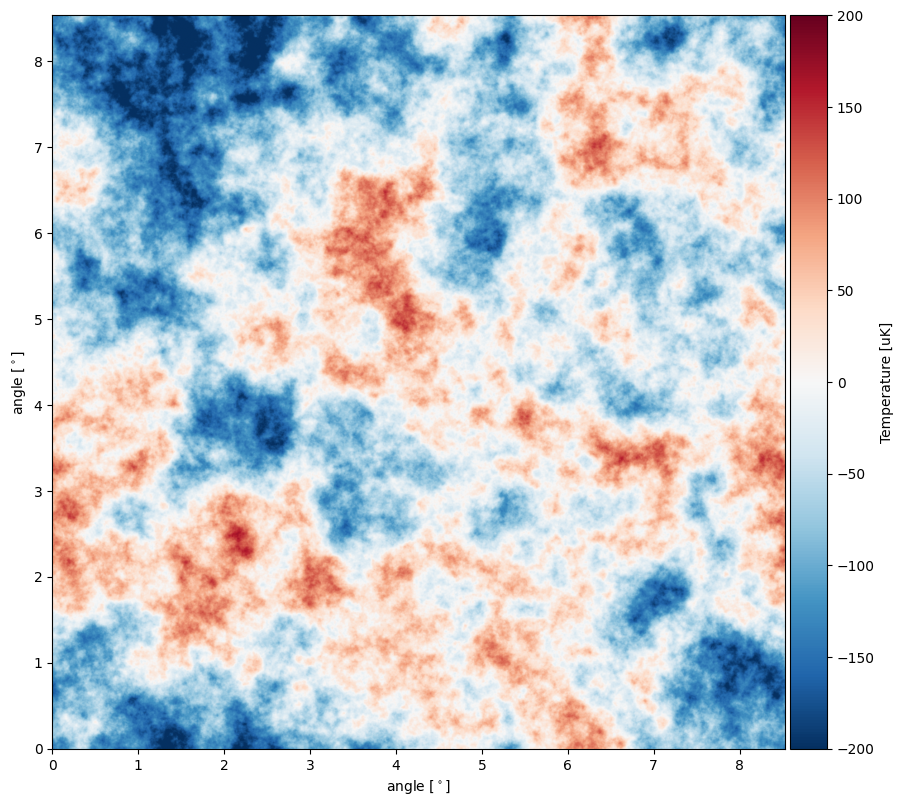

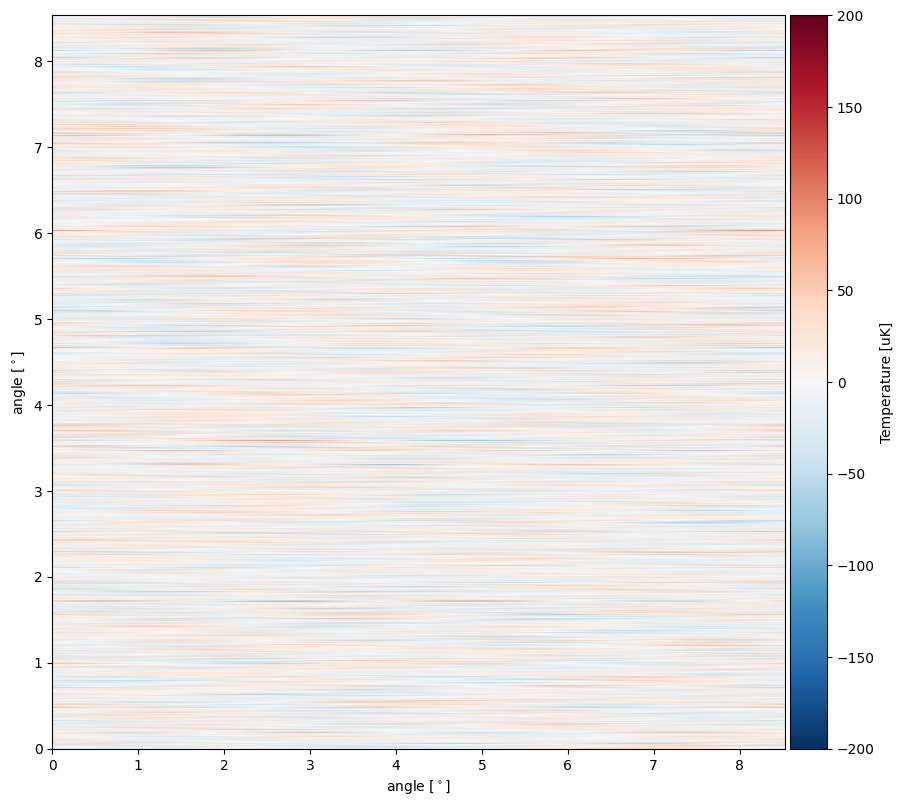

In [15]:
## your code and plots go here
white_noise = make_noise_map(N,pix_size,white_noise_level,0,0)
p=cmb_modules.Plot_CMB_Map(white_noise,c_min/2.,c_max/2.,X_width,Y_width)

atm_noise = make_noise_map(N,pix_size,0,atmospheric_noise_level,0)
p=cmb_modules.Plot_CMB_Map(atm_noise,c_min/2.,c_max/2.,X_width,Y_width)

one_over_f_noise = make_noise_map(N,pix_size,0,0,one_over_f_noise_level)
p=cmb_modules.Plot_CMB_Map(one_over_f_noise,c_min/2.,c_max/2.,X_width,Y_width)

Text(0.5, 1.0, '$1/f$ Noise FFT')

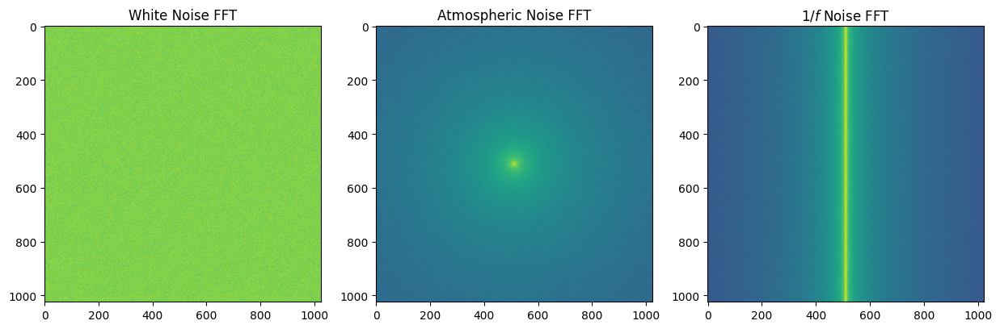

In [ ]:
# Part 2
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

white_noise_fft = np.fft.fftshift(np.abs(np.fft.fft2(white_noise)))
axs[0].imshow(np.log10(white_noise_fft));
axs[0].set_title('White Noise FFT')

atm_noise_fft = np.fft.fftshift(np.abs(np.fft.fft2(atm_noise)))
axs[1].imshow(np.log10(atm_noise_fft));
axs[1].set_title('Atmospheric Noise FFT')

one_over_f_noise_fft = np.fft.fftshift(np.abs(np.fft.fft2(one_over_f_noise)))
axs[2].imshow(np.log10(one_over_f_noise_fft));
axs[2].set_title(r'$1/f$ Noise FFT');

Your comments go here.

*The white noise looks like white noise as it is uniform everywhere and randomly distributed. We see a lot of atmospheric noise at large angular scales. The $1/f$ noise appears as horizontal stripes in the data.*

## Filtering

In maps with frequency dependent noise it is often advantageous to filter the maps to 'whiten' the noise spectrum.   There are a wide variety of choices of what to do here.  For both atmospheric and $1/f$ noise, a high pass filter would be an effective choice.  This could either be a square filter (where the modes below some cutoff are set to zero while shorter wavelength modes are kept unchanged) or a filter that weights the fourier modes by $1/A$ where $A$ is the amplitude of the noise distribution.    Below is code that masks out $N_{mask}$ fourier modes along the scan direction.  See the exercise below and play with it.

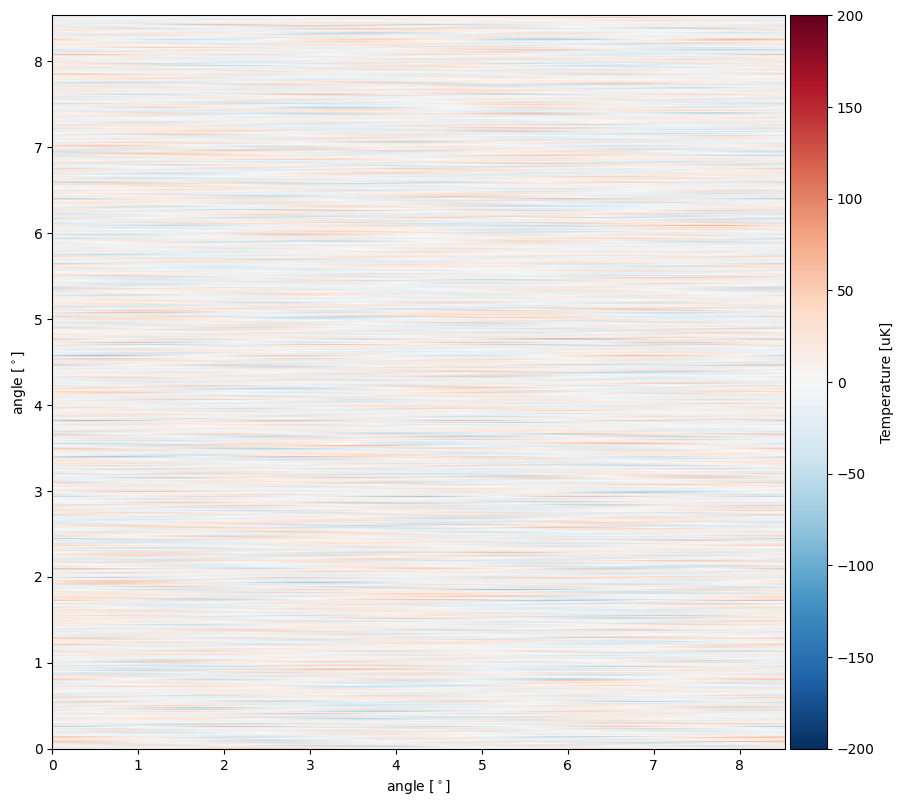

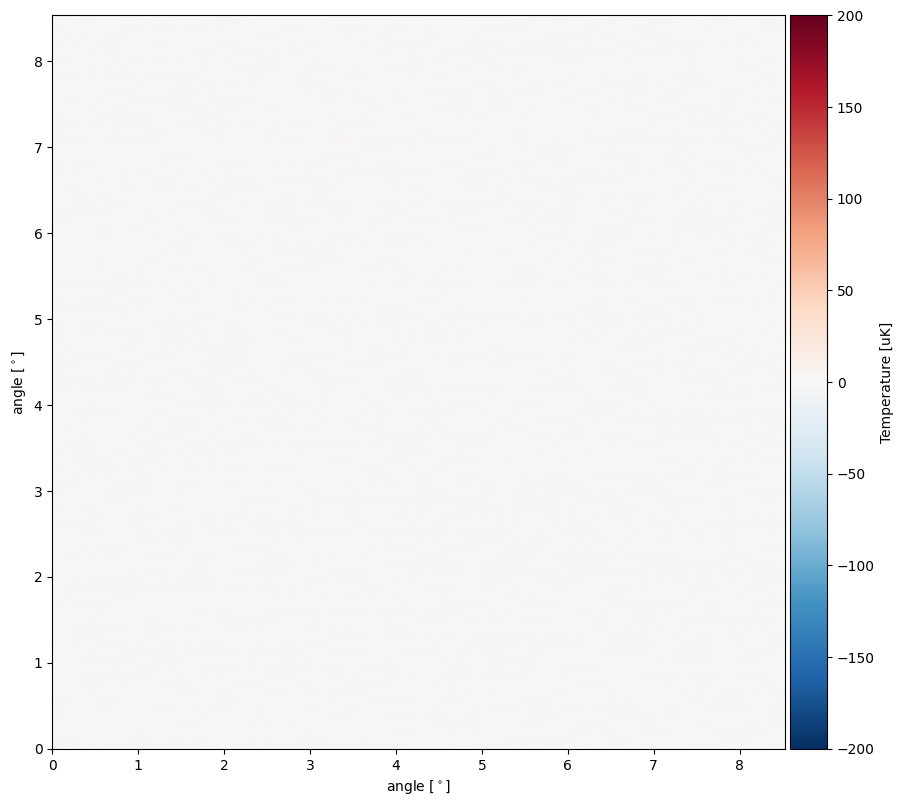

In [ ]:
N_mask =4

def Filter_Map(Map,N,N_mask):
    ## set up a x, y, and r coordinates for mask generation
    ones = np.ones(N) # N is the size of the map
    inds  = (np.arange(N)+.5 - N/2.)

    X = np.outer(ones,inds)
    Y = np.transpose(X)
    R = np.sqrt(X**2. + Y**2.)  ## angles realative to 1 degrees

    ## make a mask
    mask  = np.ones([N,N])
    mask[np.where(np.abs(X) < N_mask)]  = 0

    ## apply the filter in fourier space
    FMap = np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(Map)))
    FMap_filtered = FMap * mask
    Map_filtered = np.real(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(FMap_filtered))))

    ## return the output
    return(Map_filtered)


p=cmb_modules.Plot_CMB_Map(Noise,c_min/2,c_max/2.,X_width,Y_width)

filtered = Filter_Map(Noise,N,N_mask)
p=cmb_modules.Plot_CMB_Map(filtered,c_min/2.,c_max/2.,X_width,Y_width)

## <font color='red'>EXERCISES: </font>  
### 1. Find the minimum $N_{mask}$ that effectively whitens the noise spectrum with the bad $1/f$ turned on.  See how this filter works for atmospheric noise.

### 2. If you find the filtering choice not appropriate for atmospheric noise, make a highpass function (radial mask) and vary $N_{mask}$ to find the optimal value.

### 3. Use Smoother filters: a weighted `Filter_Map` and a cosine-apodized high-pass

* Filters with sharp edges in Fourier space can produce ripples in map space / ringing in the time domain
* `Filter_Map_smooth` -- instead of a hard strip, applies a smooth **weighted** roll-off along the scan direction, $W(k_x) = k_x^2/(k_x^2 + N_{\mathrm{mask}}^2)$, which goes smoothly from 0 at $k_x=0$ to 1 at large $k_x$.
* `highpass_standard_apodized` -- a radial high-pass whose edge is a **raised-cosine taper** of width `taper_width` centred on `kcut`, so the mask changes smoothly from 0 to 1 instead of stepping.


Point sources to visualize filter ripples:

A high-pass filter works by making a blurred (large-scale) copy of the map and subtracting it off. The blurred copy of a bright point source is a broad, faint blob smeared over the whole region around where the source sits — so subtracting it digs a shallow dip around the source. If the filter's edge is sharp, that dip doesn't fade away smoothly but oscillates outward into a set of rings — that's the ringing; a smooth-edged filter carves the same dip with no rings. We stamp a single source onto a blank map so we can see that dip-and-ring shape cleanly, instead of having thousands of them overlap.

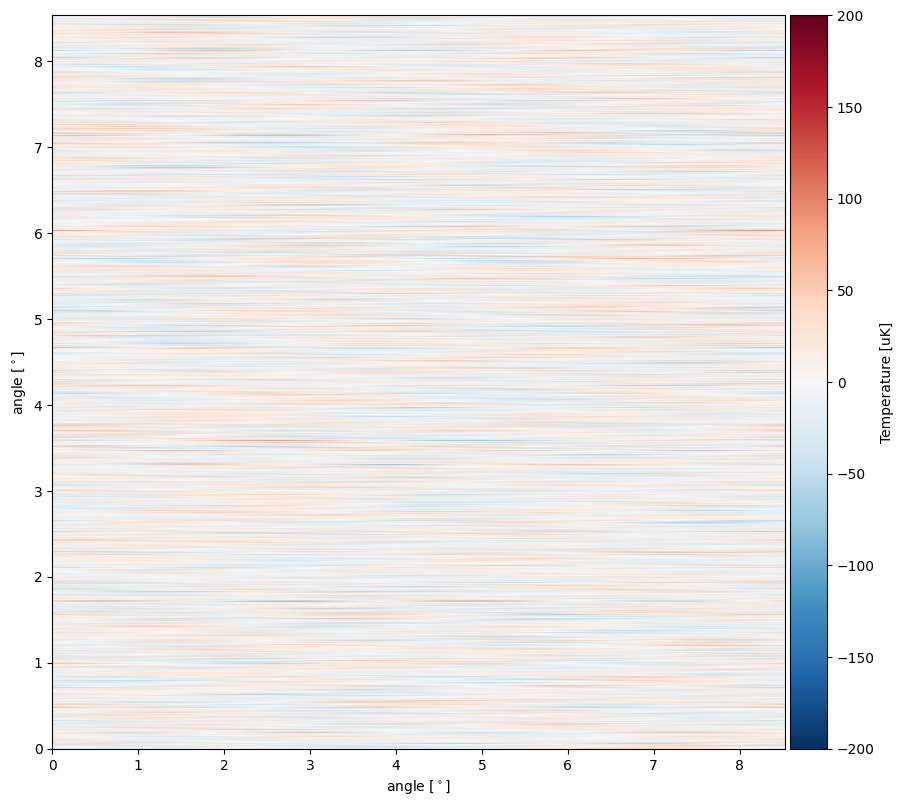

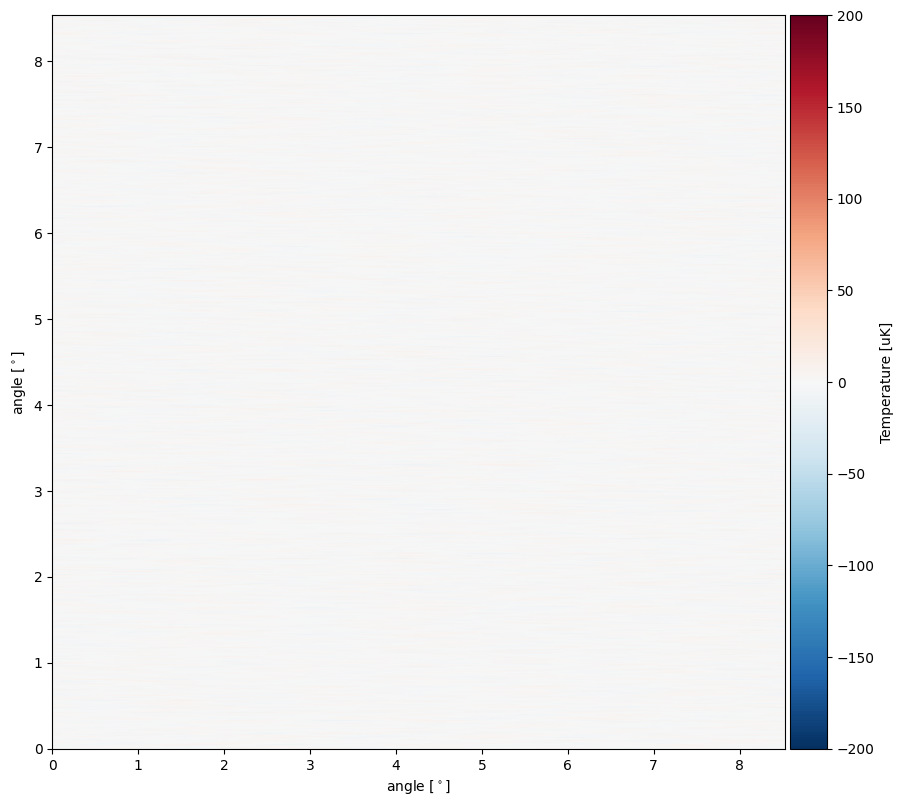

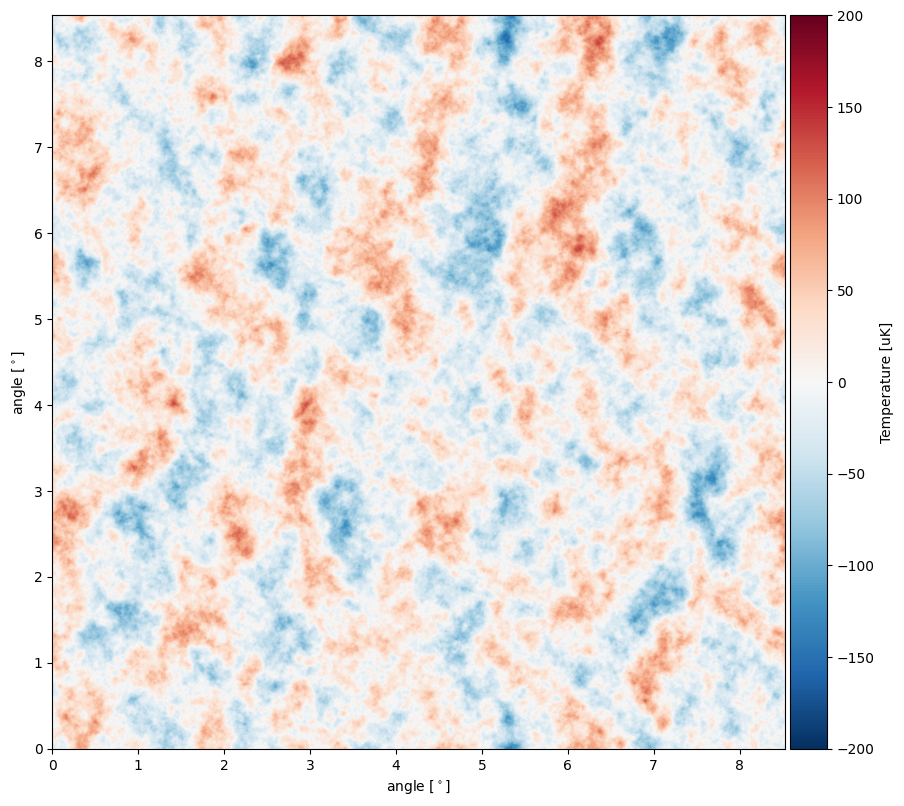

In [49]:
# 1
p=cmb_modules.Plot_CMB_Map(one_over_f_noise,c_min/2,c_max/2.,X_width,Y_width)
# plt.imshow(np.log10(one_over_f_noise_fft))

one_over_f_filtered = Filter_Map(one_over_f_noise,N,N_mask=3)
one_over_f_filtered_fft = np.fft.fftshift(np.abs(np.fft.fft2(one_over_f_filtered)))
p=cmb_modules.Plot_CMB_Map(one_over_f_filtered,c_min/2.,c_max/2.,X_width,Y_width)
# plt.imshow(np.log10(one_over_f_filtered_fft));
# plt.colorbar();

atm_filtered = Filter_Map(atm_noise,N,N_mask=3)
p=cmb_modules.Plot_CMB_Map(atm_filtered,c_min/2.,c_max/2.,X_width,Y_width)

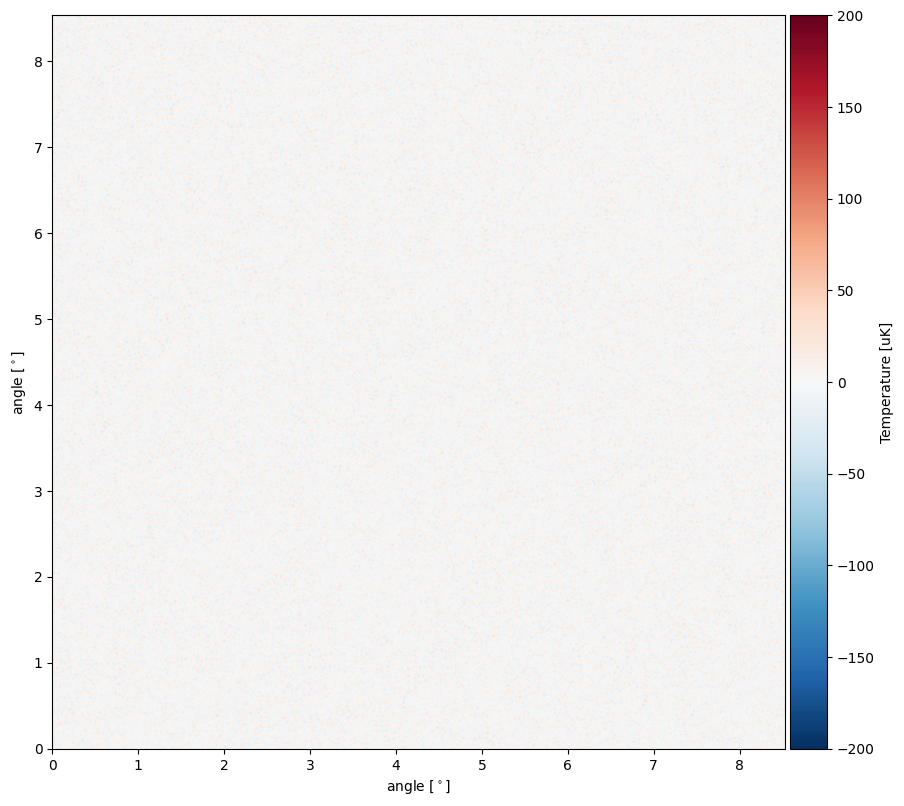

C:\Users\ricco\AppData\Local\Temp\ipykernel_2992\3654834828.py:27: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(atm_filtered_fft));


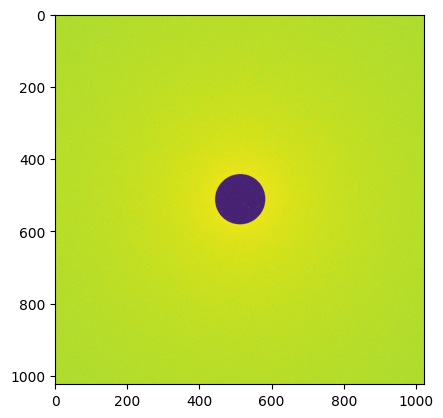

In [54]:
# 2
def highpass_Filter_Map(Map,N,N_mask):
    ## set up a x, y, and r coordinates for mask generation
    ones = np.ones(N) # N is the size of the map
    inds  = (np.arange(N)+.5 - N/2.)

    X = np.outer(ones,inds)
    Y = np.transpose(X)
    R = np.sqrt(X**2. + Y**2.)  ## angles realative to 1 degrees

    ## make a mask
    mask  = np.ones([N,N])
    mask[R < N_mask]  = 0

    ## apply the filter in fourier space
    FMap = np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(Map)))
    FMap_filtered = FMap * mask
    Map_filtered = np.real(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(FMap_filtered))))

    ## return the output
    return(Map_filtered)

atm_filtered = highpass_Filter_Map(atm_noise,N,N_mask=70)
p=cmb_modules.Plot_CMB_Map(atm_filtered,c_min/2.,c_max/2.,X_width,Y_width)

atm_filtered_fft = np.fft.fftshift(np.abs(np.fft.fft2(atm_filtered)))
plt.imshow(np.log10(atm_filtered_fft));

In [ ]:
# 3
def Filter_map_smooth(Map, N: int, N_mask: int):
    """
    Applies a smooth weighted roll-off along the scan direction such that
    W(k_x) = k_x^2 / (k_x^2 + N_mask^2)
    """

    ## set up a x, y, and r coordinates for mask generation
    ones = np.ones(N) # N is the size of the map
    inds  = (np.arange(N)+.5 - N/2.)

    X = np.outer(ones,inds)
    Y = np.transpose(X)

    ## make a mask
    mask  = np.ones([N,N])
    mask[np.where(np.abs(X) < N_mask)]  = 0

    ## apply the filter in fourier space
    FMap = np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(Map)))
    FMap_filtered = FMap * mask
    Map_filtered = np.real(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(FMap_filtered))))

    ## return the output
    return(Map_filtered)    

Number of sources required:  10
map mean: 4.743384504624082e-20 map rms: 0.6238140845040457


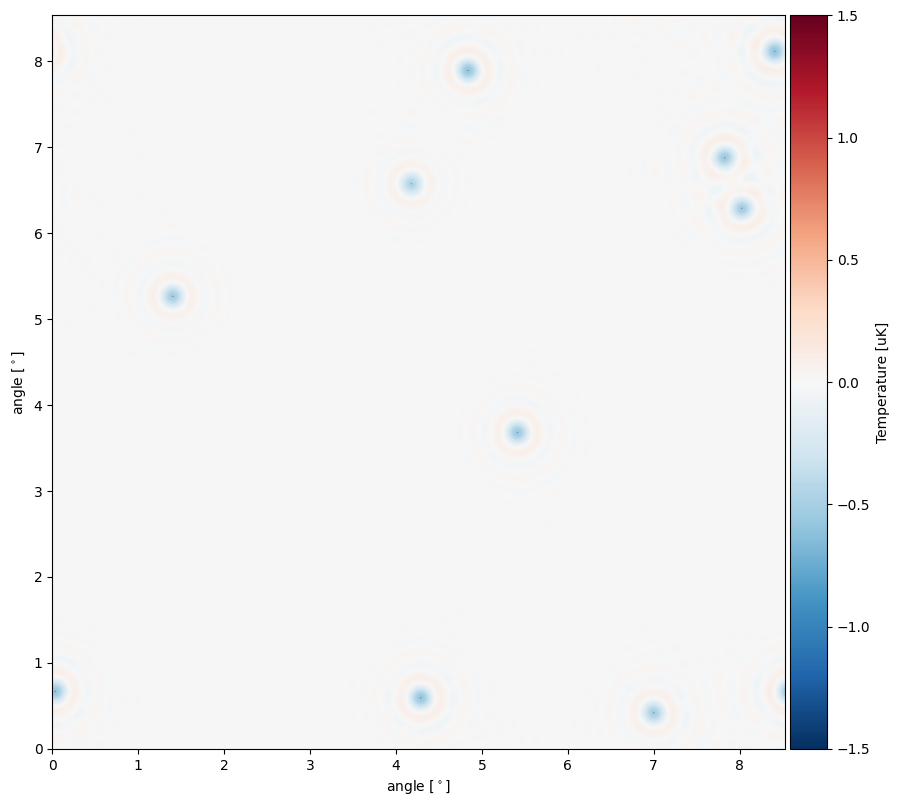

map mean: -1.2295212624988203e-19 map rms: 0.6234695928872015


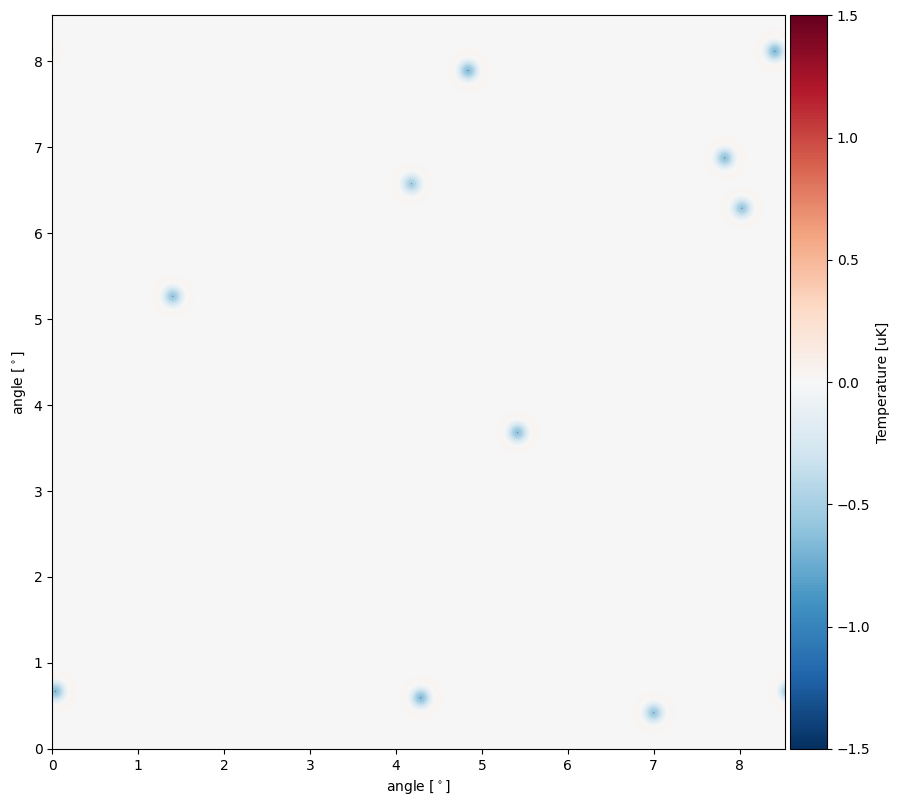

In [ ]:
## One Poisson point source, built with the function above
PSMap_one = cmb_modules.Poisson_source_component(N, pix_size, 10, Amplitude_of_Sources)

## Sharp vs smooth radial high-pass, plotting with tight color scale so the ~1 uK ringing is visible
p = cmb_modules.Plot_CMB_Map(highpass_map(PSMap_one, N, N_mask_hp), -1.5, 1.5, X_width, Y_width)
p = cmb_modules.Plot_CMB_Map(highpass_standard_apodized(PSMap_one, N, N_mask_hp, 40), -1.5, 1.5, X_width, Y_width)

## Complete Simulated CMB Map

We complete our simulated CMB map by adding the simulated sky map convolved with the beam to our simulated noise map.   

map mean: -4.1851267479001795 map rms: 118.50860653919219


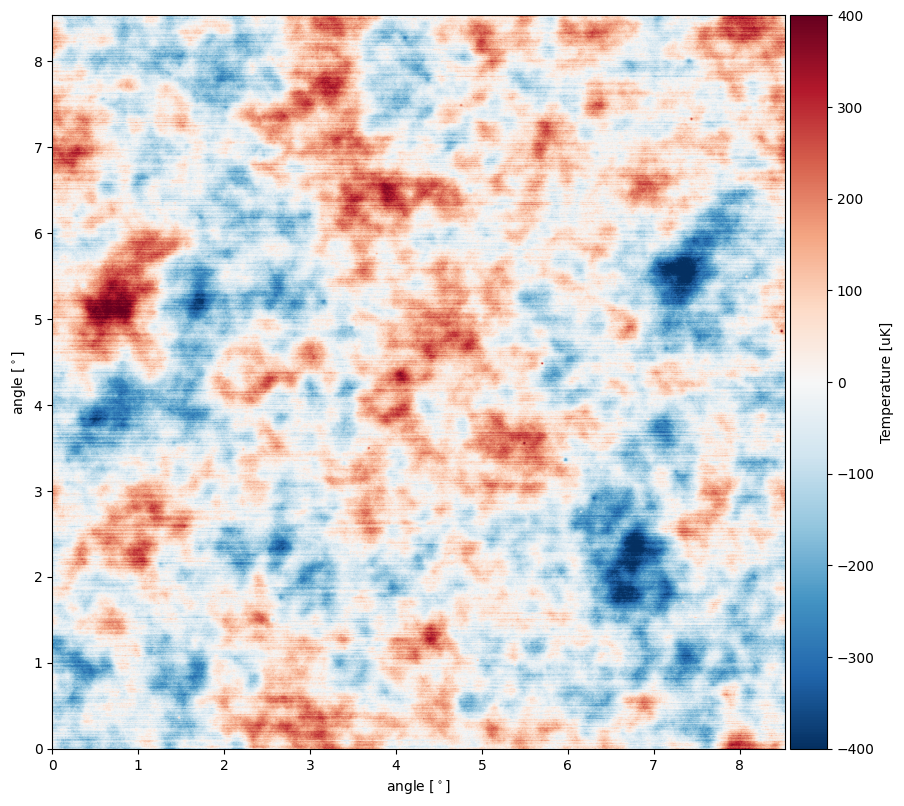

In [ ]:
CMB_T_convolved =convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,total_map)

total_map_plus_noise = CMB_T_convolved + Noise

p=cmb_modules.Plot_CMB_Map(total_map_plus_noise,c_min,c_max,X_width,Y_width)

This plot shows a complete simulated CMB map including the key astrophysical and instrumental effects. Compare it to the CMB map without noise at the top of this notebook and note the change!